In [1]:
!pip install --upgrade pip

Defaulting to user installation because normal site-packages is not writeable


In [2]:
!pip install fastparquet

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import numpy as np
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import layers

import os, sys
import pandas as pd

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.metrics import adjusted_rand_score, confusion_matrix,classification_report

module_path = os.path.abspath(os.path.join("../.."))
if module_path not in sys.path:
    sys.path.append(module_path)
from lib.graphUtils import (
    show_pie,
    show_lines,
    show_pca_variance_graph,
    show_pca_correlation_graph,
    show_scatter_graph,
    show_cols_boxplots_by_col,
    view_clustered_heatmap,
)
import plotly.io as pio
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns

import cv2

pio.renderers.default = "iframe"

import glob

2023-05-31 14:32:07.520410: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Chargement des données

In [4]:
df = pd.read_parquet("../../etude_classification_texte/working/cleaned.parquet")

In [5]:
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category0,cleaned_product_name,cleaned_description
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",home furnishing,polyest multicolor abstract eyelet door curtain,polyest multicolor abstract eyelet door curtai...
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",baby care,cotton bath towel,cotton bath towel bath towel yellow blue bath ...
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",baby care,cotton terri face towel,cotton terri face towel small cotton terri fac...
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",home furnishing,cotton king doubl bedsheet,cotton king doubl bedsheet royal bedsheet perf...
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",home furnishing,cotton floral king doubl bedsheet,cotton floral king doubl bedsheet cotton cotto...


# Récupération du modèle VGG16

In [6]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

## Loading VGG16 model
base_model = VGG16(weights="imagenet", input_shape=(224,224,3))
base_model.trainable = False ## Not trainable weights


2023-05-31 14:32:10.244749: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


2023-05-31 14:32:10.288669: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-31 14:32:10.288926: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-31 14:32:10.290178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

553467096/553467096 [==============================] - 64s 0us/step


In [7]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

## Visualisation des couches de convolution

### Exemple de filtres de convolution

Nous allons visualiser les filtres utilisés pour la 1ère couche de convolution. Pour rappel, celle-ci admet en entrée l'image d'entrée sous forme de table de 224(h)x224(w)x3(rgb) et sort un tableau 224x224x64

In [8]:
filters, biases = base_model.layers[1].get_weights()

In [9]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import math

nb_filters = filters.shape[-1]
rows = math.ceil(nb_filters/8)
fig = make_subplots(rows=rows, cols=24)
for i in range(0, nb_filters):
    cur_filter = filters[:,:,:, i]
    y = math.floor(i / 8) + 1
    x = (i % 8) + 1
    fig.add_trace(
        go.Heatmap(z=cur_filter[:,:,0], colorscale=[[0, 'rgb(0,0,0)'], [1, 'rgb(255,0,0)']], showscale=False, ),
        row=y, col=x
    )
    fig.update_xaxes(showticklabels=False, row=y, col=x)
    fig.update_yaxes(showticklabels=False, row=y, col=x)

    fig.add_trace(
        go.Heatmap(z=cur_filter[:,:,1], colorscale=[[0, 'rgb(0,0,0)'], [1, 'rgb(0,255,0)']], showscale=False, ),
        row=y, col=x+8
    )
    fig.update_xaxes(showticklabels=False, row=y, col=x+8)
    fig.update_yaxes(showticklabels=False, row=y, col=x+8)

    fig.add_trace(
        go.Heatmap(z=cur_filter[:,:,2], colorscale=[[0, 'rgb(0,0,0)'], [1, 'rgb(0,0,255)']], showscale=False, ),
        row=y, col=x+16
    )
    fig.update_xaxes(showticklabels=False, row=y, col=x+16)
    fig.update_yaxes(showticklabels=False, row=y, col=x+16)



fig.update_layout(
    width=1300, height=400,
    showlegend=False,
    margin=dict(l=20, r=20, t=20, b=20),
)

fig.show()


### Visualisation des transformations d'une image

In [10]:
df.loc[df["category0"]=="watches"].head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category0,cleaned_product_name,cleaned_description
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[""Watches >> Wrist Watches >> Maserati Time Wr...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,Maserati Time R8851116001 Analog Watch - For ...,No rating available,No rating available,None,"{""product_specification""=>[{""key""=>""Chronograp...",watches,maserati time analog watch,maserati time analog watch maserati time analo...
6,f355cc1ccb08bd0d283ed979b7ee7515,2015-12-04 07:25:36 +0000,http://www.flipkart.com/camerii-wm64-elegance-...,"Camerii WM64 Elegance Analog Watch - For Men,...","[""Watches >> Wrist Watches >> Camerii Wrist Wa...",WATE6Y6D2MZHWGBZ,1099.0,449.0,f355cc1ccb08bd0d283ed979b7ee7515.jpg,False,"Camerii WM64 Elegance Analog Watch - For Men,...",5,5,None,"{""product_specification""=>[{""key""=>""Chronograp...",watches,camerii eleg analog watch,camerii eleg analog watch camerii eleg analog ...
7,dd0e3470a7e6ed76fd69c2da27721041,2015-12-04 07:25:36 +0000,http://www.flipkart.com/t-star-uft-tsw-005-bk-...,T STAR UFT-TSW-005-BK-BR Analog Watch - For Boys,"[""Watches >> Wrist Watches >> T STAR Wrist Wat...",WATECFFVGFZPAD3D,999.0,399.0,dd0e3470a7e6ed76fd69c2da27721041.jpg,False,T STAR UFT-TSW-005-BK-BR Analog Watch - For B...,No rating available,No rating available,None,"{""product_specification""=>[{""key""=>""Chronograp...",watches,star analog watch,star analog watch whether work travel abroad f...
8,41384da51732c0b4df3de8f395714fbb,2015-12-04 07:25:36 +0000,http://www.flipkart.com/alfajr-wy16b-youth-dig...,"Alfajr WY16B Youth Digital Watch - For Men, Boys","[""Watches >> Wrist Watches >> Alfajr Wrist Wat...",WATECHFU4QGFQEJG,5495.0,4995.0,41384da51732c0b4df3de8f395714fbb.jpg,False,"Alfajr WY16B Youth Digital Watch - For Men, B...",No rating available,No rating available,None,"{""product_specification""=>[{""key""=>""Chronograp...",watches,alfajr youth digit watch,alfajr youth digit watch alfajr youth digit wa...
9,710ed5f2393a4b9e8823aa0029f71f93,2015-12-04 07:25:36 +0000,http://www.flipkart.com/tag-heuer-cau1116-ba08...,TAG Heuer CAU1116.BA0858 Formula 1 Analog Watc...,"[""Watches >> Wrist Watches >> TAG Heuer Wrist ...",WATEA6UGFGKZKDJC,107750.0,107750.0,710ed5f2393a4b9e8823aa0029f71f93.jpg,False,TAG Heuer CAU1116.BA0858 Formula 1 Analog Watc...,No rating available,No rating available,None,"{""product_specification""=>[{""key""=>""Chronograp...",watches,heuer formula analog watch,heuer formula analog watch heuer formula analo...


Nous allons ici utiliser 3 images pour voir comme les différents filtres les transforment

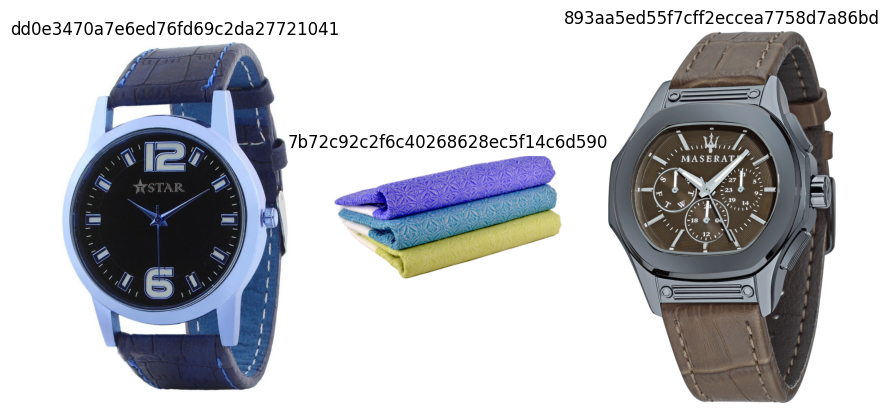

In [12]:
uniq_ids = []
uniq_ids.append(df.iloc[7]["uniq_id"])
uniq_ids.append(df.iloc[1]["uniq_id"])
uniq_ids.append(df.iloc[5]["uniq_id"])

img0 = cv2.imread("../../etude_classification_texte/assets/Flipkart/Images/"+uniq_ids[0]+".jpg")
img1 = cv2.imread("../../etude_classification_texte/assets/Flipkart/Images/"+uniq_ids[1]+".jpg")
img2 = cv2.imread("../../etude_classification_texte/assets/Flipkart/Images/"+uniq_ids[2]+".jpg")

fig = plt.figure(figsize=(10, 7))
fig.add_subplot(1, 3, 1)
plt.imshow(img0)
plt.axis('off')
plt.title(uniq_ids[0])

fig.add_subplot(1, 3, 2)
plt.imshow(img1)
plt.axis('off')
plt.title(uniq_ids[1])

fig.add_subplot(1, 3, 3)
plt.imshow(img2)
plt.axis('off')
plt.title(uniq_ids[2])

plt.show()

On commence par récupérer les couches Conv2D et MaxPooling2D

In [13]:
layer_outputs = []
layer_names = []
for layer in base_model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=base_model.input, outputs=layer_outputs)

On crée un fonction qui va afficher les 32 premiers résultats pour chaque layer pour une entrée donnée

In [14]:
def show_layers_outputs(activations, layer_names):
    images_per_row = 16
    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]
        n_cols = min(2, n_features // images_per_row)
        display_grid = np.zeros(((size + 1) * n_cols - 1,
                                 images_per_row * (size + 1) - 1))
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_index = col * images_per_row + row
                channel_image = layer_activation[0, :, :, channel_index].copy()
                if channel_image.sum() != 0:
                    channel_image -= channel_image.mean()
                    channel_image /= channel_image.std()
                    channel_image *= 64
                    channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype("uint8")
                display_grid[
                    col * (size + 1): (col + 1) * size + col,
                    row * (size + 1) : (row + 1) * size + row] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.axis("off")
        plt.imshow(display_grid, aspect="auto", cmap="binary")
        

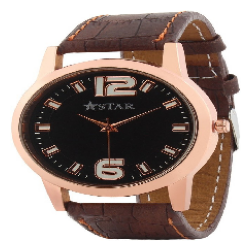

2023-05-31 14:39:35.950917: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600


1/1 [==============================] - 5s 5s/step


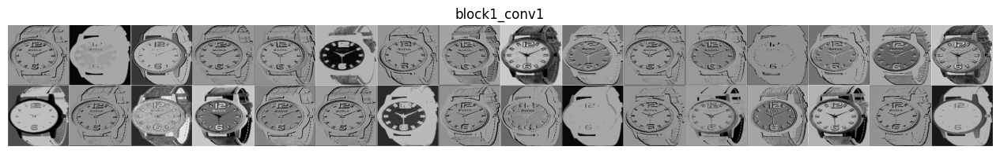

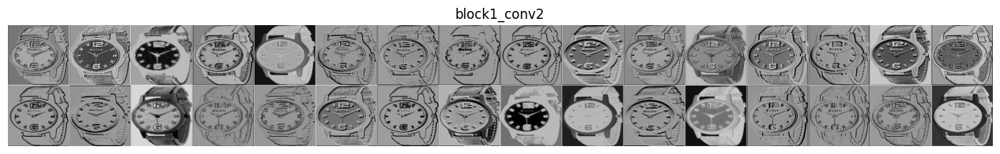

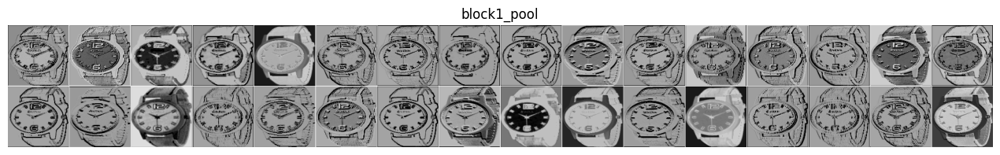

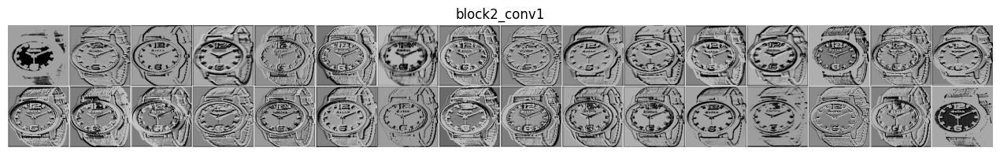

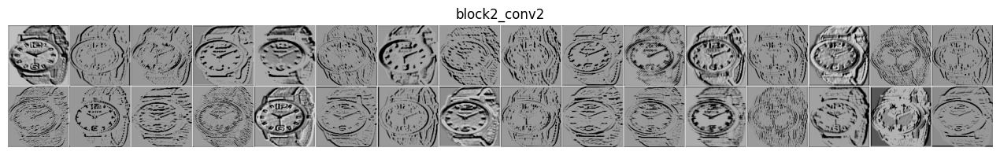

...

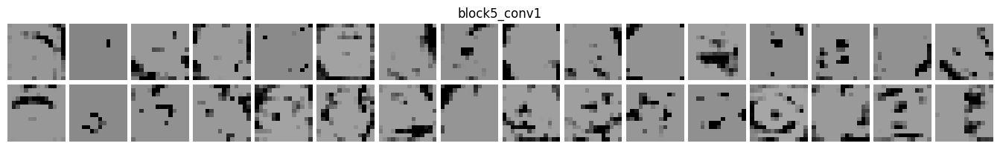

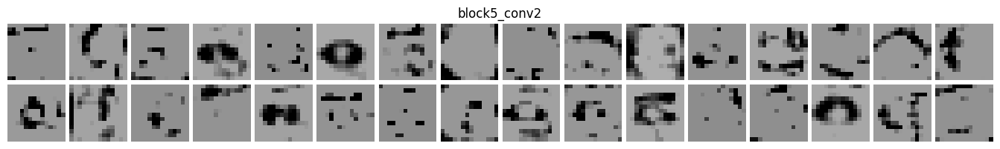

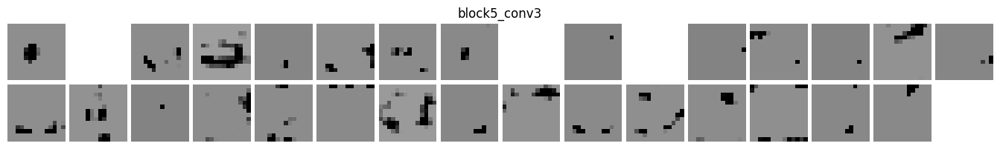

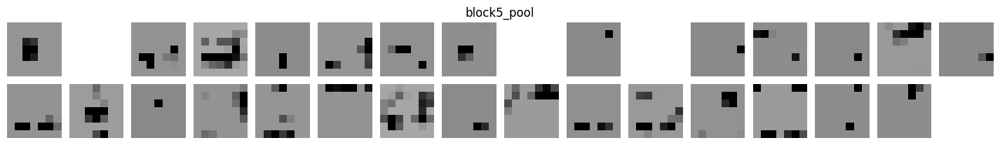

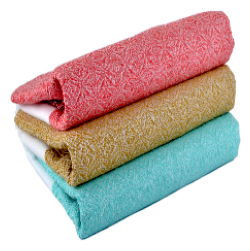

1/1 [==============================] - 0s 16ms/step


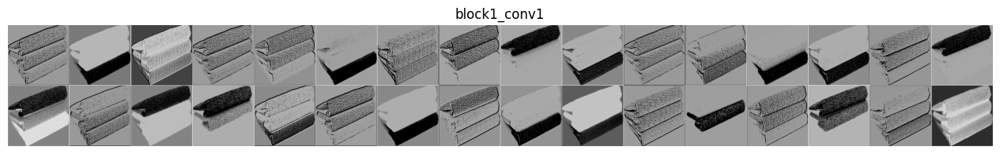

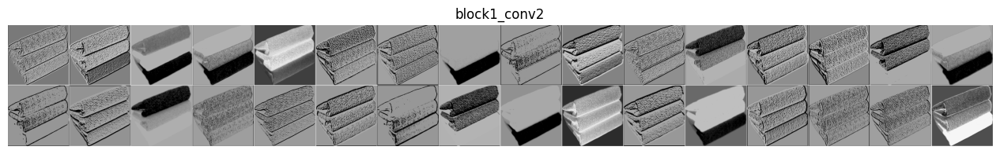

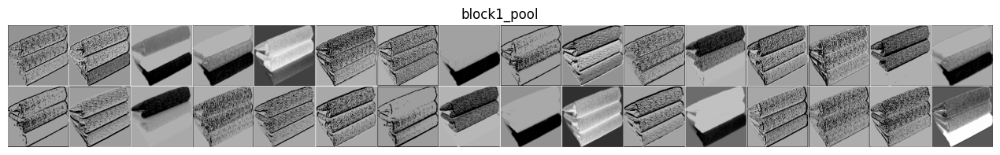

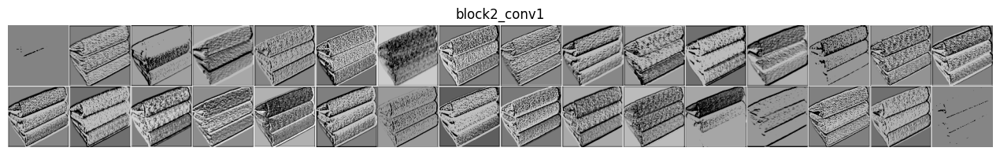

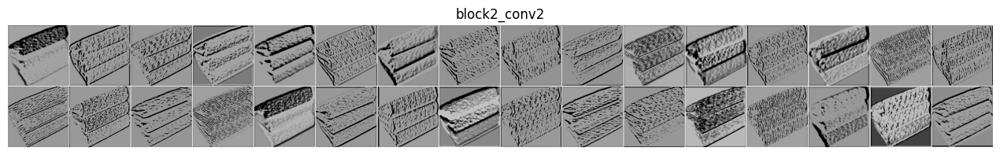

...

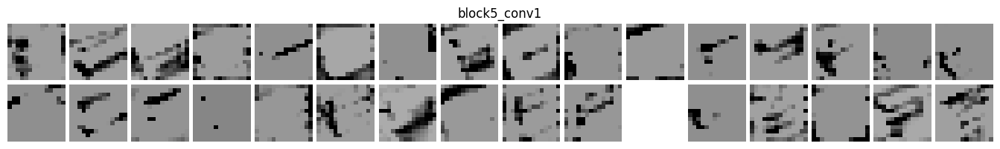

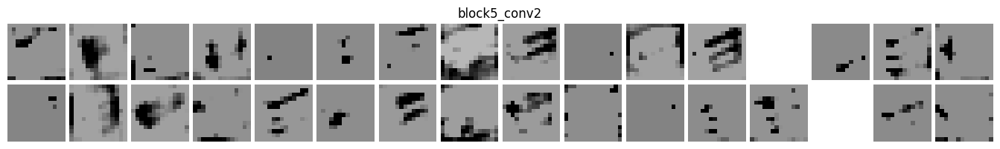

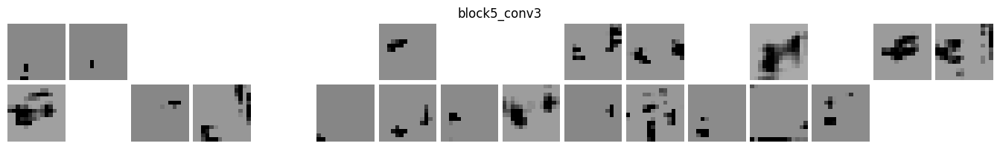

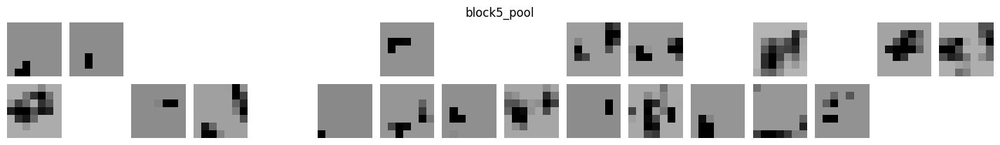

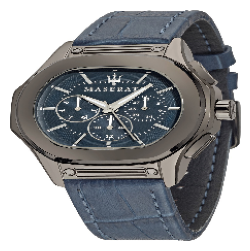

1/1 [==============================] - 0s 16ms/step


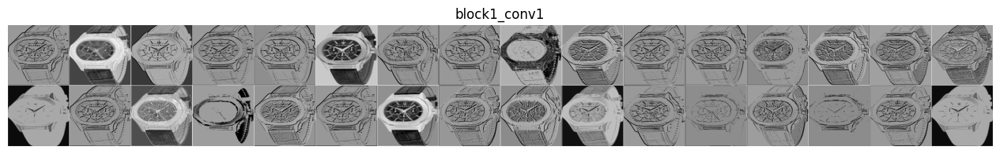

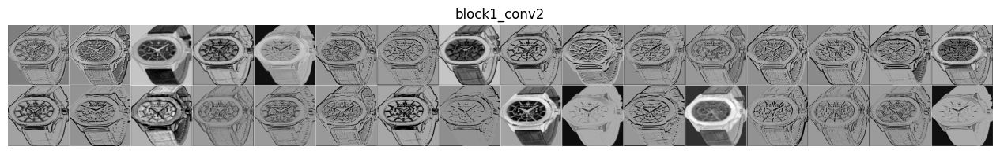

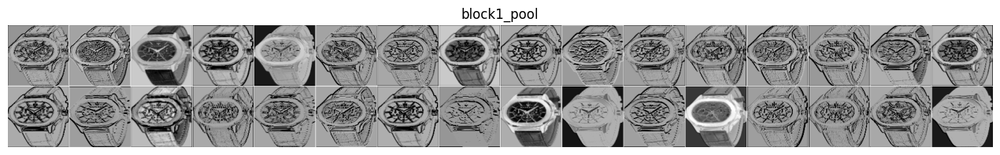

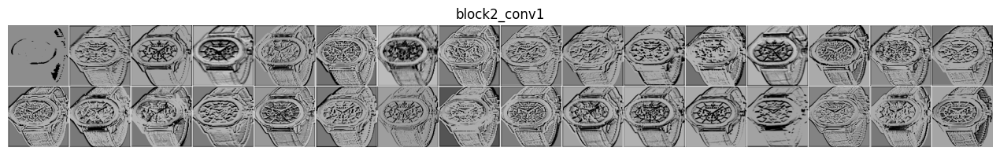

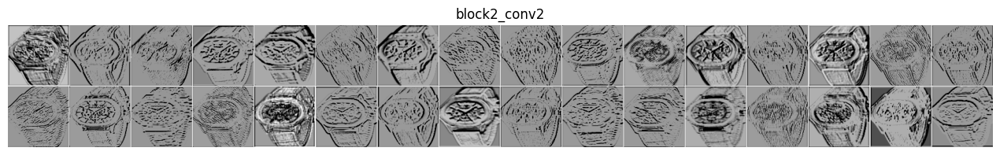

...

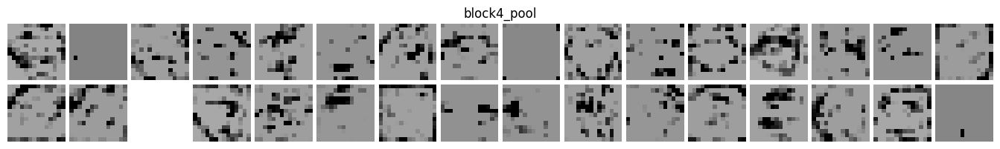

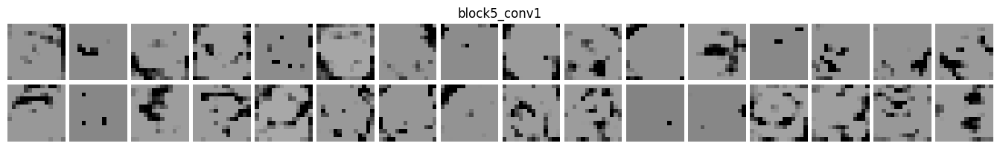

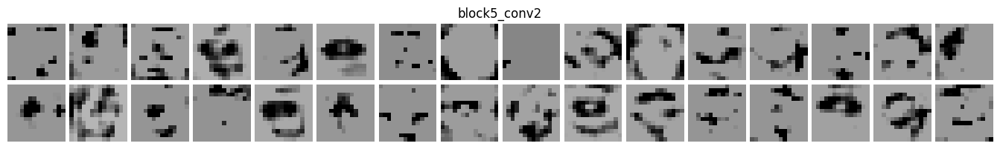

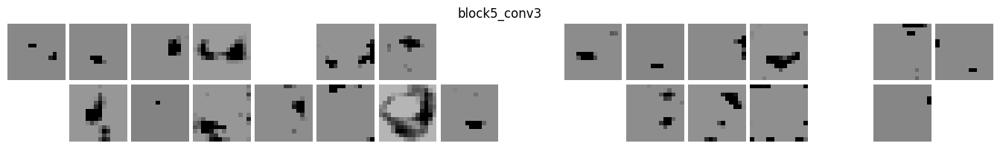

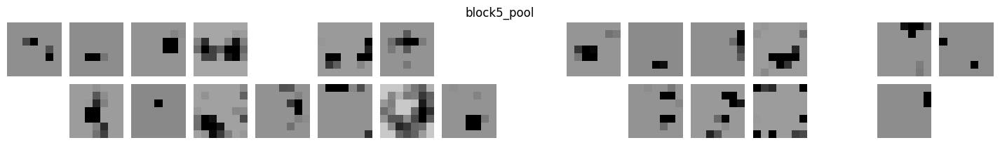

In [16]:
for uniq_id in uniq_ids:
    image = load_img(f"../../etude_classification_texte/assets/Flipkart/Images/{uniq_id}.jpg", target_size=(224, 224))
    fig = plt.figure(figsize=(3,3))
    plt.axis('off')
    plt.imshow(image)   
    plt.show()

    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    activations = activation_model.predict(image)
    show_layers_outputs(activations, layer_names)

# Supppression de la couche de décision

In [17]:
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

In [18]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

# Calcul des features

In [20]:
images_features = []
nb_done = 0
for uniq_id in df["uniq_id"]:
    image = load_img(f"../../etude_classification_texte/assets/Flipkart/Images/{uniq_id}.jpg", target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model
    nb_done += 1
    if nb_done % 100 == 0:
        print(nb_done)

100
200
300
400
500
600


/home/jupyter/.local/lib/python3.8/site-packages/PIL/Image.py:3176: DecompressionBombWarning:

Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



700
800
900
1000


In [21]:
len(images_features)

1050

In [22]:
images_features = np.asarray(images_features)
images_features.shape

(1050, 4096)

Nous avons donc pour chacun des 1050 images de produits une feature associée qui se présente sous la forme d'un vecteur de 4096 éléments

In [23]:
X = images_features

# Projection PCA

In [24]:
pca = PCA(n_components=1050)
pca.fit(X)

PCA(n_components=1050)

In [25]:
show_pca_variance_graph(pca)

In [26]:
pca = PCA(n_components=805)
X_pca = pca.fit_transform(X)

In [27]:
show_scatter_graph(
    x=X_pca[:,0],
    y=X_pca[:,1],
    colors=df["category0"],
    title="Projection PCA sur les 2 premiers axes",
)

In [28]:
show_scatter_graph(
    x=X_pca[:,2],
    y=X_pca[:,3],
    colors=df["category0"],
    title="Projection PCA sur les axes 2 et 3",
)

In [29]:
show_scatter_graph(
    x=X_pca[:,4],
    y=X_pca[:,5],
    colors=df["category0"],
    title="Projection PCA sur les axes 4 et 5",
)

# Projection tSNE

In [30]:
tsne = TSNE(n_components=2, random_state=0)
X_embedded = tsne.fit_transform(X_pca)

In [31]:
show_scatter_graph(
    x=X_embedded[:,0],
    y=X_embedded[:,1],
    colors=df["category0"],
    title="Projection tSNE des features extraites via VGG16 avec la catégorie",
)

On distingue bien certains clusters comme groupes de catégories au sein de la projection tSNE. 
Validons cela par une clusterisation KMeans avec 7 clusters.

In [32]:
kmeans = KMeans(n_clusters=7,n_init="auto", random_state=0)
kmeans.fit(X_embedded)

KMeans(n_clusters=7, n_init='auto', random_state=0)

In [33]:
df["kmeans_label"] = kmeans.labels_.astype(str)

In [34]:
show_scatter_graph(
    x=X_embedded[:,0],
    y=X_embedded[:,1],
    colors=df["kmeans_label"],
    title="Projection tSNE des features extraites via VGG16 avec clustering kmeans",
)

In [35]:
adjusted_rand_score(df["category0"], df["kmeans_label"])

0.4524208860793498

# Conclusion
## Matrice de confusion

In [37]:
pd.crosstab(df["category0"], df["kmeans_label"]).reset_index()

kmeans_label,category0,0,1,2,3,4,5,6
0,baby care,3,1,108,1,29,1,7
1,beauty and personal care,117,8,4,1,13,1,6
2,computers,1,113,1,1,34,0,0
3,home decor & festive needs,1,5,2,8,76,0,58
4,home furnishing,0,0,77,0,5,0,68
5,kitchen & dining,10,31,0,0,31,78,0
6,watches,0,13,0,135,2,0,0


En regardant les classes kmeans_labels majoritaires, on voit les correspondances:

|classe kmeans|classe réelle majoritaire|
|--------------|-------------|
|0|beauty and personal care|
|1|computers|
|2|baby care|
|3|watches|
|4|home decor & festive needs|
|5|kitchen & dining|
|6|home furnishing|

In [46]:
df["category_pred"] = ""

In [47]:
corr_labels = [
    "beauty and personal care",
    "computers",
    "baby care",
    "watches",
    "home decor & festive needs",
    "kitchen & dining",
    "home furnishing",
]

In [48]:
index_labels = ["baby_care", "beauty and personal care", "computers", "home decor & festive needs", "home furnishing", "kitchen & dining", "watches"]

In [49]:
for i in range(0, len(corr_labels)):
    df.loc[df["kmeans_label"]==f"{i}", "category_pred"] = corr_labels[i]

In [50]:
conf_mat = confusion_matrix(df["category0"], df["category_pred"])

In [51]:
conf_mat

array([[108,   3,   1,  29,   7,   1,   1],
       [  4, 117,   8,  13,   6,   1,   1],
       [  1,   1, 113,  34,   0,   0,   1],
       [  2,   1,   5,  76,  58,   0,   8],
       [ 77,   0,   0,   5,  68,   0,   0],
       [  0,  10,  31,  31,   0,  78,   0],
       [  0,   0,  13,   2,   0,   0, 135]])

<Axes: >

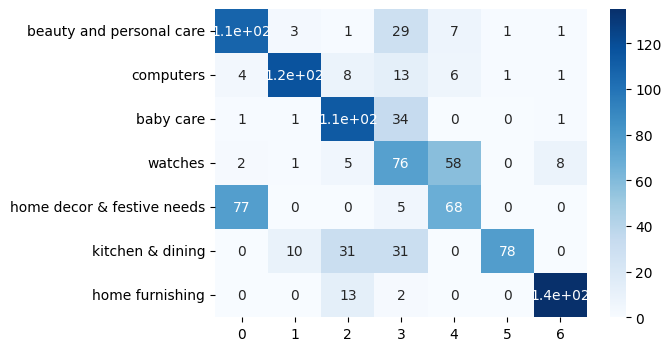

In [54]:
df_cm = pd.DataFrame(conf_mat, index = corr_labels,
                  columns = [i for i in "0123456"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues")

On visualise un clustering beaucoup plus net qu'avec SIFT. 
Il reste néanmoins quelques doutes entre les catégories "home decor & festive needs" et "home furnishing".

## Score de classification

In [55]:
print(classification_report(df["category0"], df["category_pred"]))

                            precision    recall  f1-score   support

                 baby care       0.56      0.72      0.63       150
  beauty and personal care       0.89      0.78      0.83       150
                 computers       0.66      0.75      0.70       150
home decor & festive needs       0.40      0.51      0.45       150
           home furnishing       0.49      0.45      0.47       150
          kitchen & dining       0.97      0.52      0.68       150
                   watches       0.92      0.90      0.91       150

                  accuracy                           0.66      1050
                 macro avg       0.70      0.66      0.67      1050
              weighted avg       0.70      0.66      0.67      1050



On constate d'assez bons résultats avec un clustering simple.

Les catégories "home decor & festive needs" et "home furnishing" présente les moins bons résultats, il semblerait que le clustering mélange les produits de ces 2 catégories.